In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
import os

os.listdir('/content/drive/MyDrive')


['Colab Notebooks',
 'IMG-20230922-WA0027.jpg',
 'IMG-20230922-WA0032 (1).jpg',
 'IMG-20230922-WA0011 (1).jpg',
 'IMG-20230922-WA0026 (1).jpg',
 'IMG-20230922-WA0013 (1).jpg',
 'IMG-20230922-WA0025 (1).jpg',
 'IMG-20230922-WA0033 (1).jpg',
 'IMG-20230922-WA0030 (2).jpg',
 'IMG-20230922-WA0023 (1).jpg',
 'IMG-20230922-WA0028 (1).jpg',
 'IMG-20230922-WA0006.jpg',
 'IMG-20230922-WA0026.jpg',
 'IMG-20230922-WA0032.jpg',
 'IMG-20230922-WA0023.jpg',
 'IMG-20230922-WA0011.jpg',
 'IMG-20230922-WA0030 (1).jpg',
 'IMG-20230922-WA0013.jpg',
 'IMG-20230922-WA0025.jpg',
 'IMG-20230922-WA0028.jpg',
 'IMG-20230922-WA0033.jpg',
 'IMG-20230922-WA0030.jpg',
 'Project',
 'Subashini_Resume.pdf',
 'Datasets',
 'test',
 'train',
 'val',
 'leaf1.jpg',
 'dataset',
 '2 img.jpg',
 'images (29).jpg',
 'red rot image.jpg',
 'split_dataset',
 'leaf2.jpg',
 'leaf3.jpg',
 'leaf4.jpg',
 'leaf5.jpg',
 'leaf6.jpg',
 'leaf7.jpg',
 'leaf8.jpg',
 'leaf9.jpg',
 'leaf10.jpg',
 'leaf12.jpg',
 'leaf11.jpg',
 'leaf13.jpg',
 'l

In [3]:
# Classification dataset
DATASET1_PATH = "/content/drive/MyDrive/dataset1"

# Detection dataset
DATASET2_IMAGES = "/content/drive/MyDrive/dataset2/images"
DATASET2_ANN = "/content/drive/MyDrive/dataset2/annotations"


In [4]:
import os

base_path = "/content/drive/MyDrive/dataset1"
splits = ["train", "val", "test"]

for split in splits:
    print(f"\n{split.upper()}")
    for cls in sorted(os.listdir(os.path.join(base_path, split))):
        cls_path = os.path.join(base_path, split, cls)
        if os.path.isdir(cls_path):
            print(f"{cls}: {len(os.listdir(cls_path))} images")



TRAIN
bacterial_spot: 74 images
brown_rust: 74 images
early_blight: 73 images
grey_spot: 76 images
healthy_leafs: 77 images
mild_dew: 74 images
red_rot: 74 images

VAL
bacterial_spot: 15 images
brown_rust: 15 images
early_blight: 15 images
grey_spot: 16 images
healthy_leafs: 16 images
mild_dew: 16 images
red_rot: 16 images

TEST
bacterial_spot: 17 images
brown_rust: 17 images
early_blight: 17 images
grey_spot: 17 images
healthy_leafs: 17 images
mild_dew: 17 images
red_rot: 17 images


In [5]:
from torchvision import transforms

train_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

val_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


In [6]:
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader

train_ds = ImageFolder(root=f"{base_path}/train", transform=train_tfms)
val_ds   = ImageFolder(root=f"{base_path}/val",   transform=val_tfms)
test_ds  = ImageFolder(root=f"{base_path}/test",  transform=val_tfms)

train_loader = DataLoader(train_ds, batch_size=16, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_ds,   batch_size=16, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_ds,  batch_size=16, shuffle=False, num_workers=2)


In [7]:
print(train_ds.class_to_idx)


{'bacterial_spot': 0, 'brown_rust': 1, 'early_blight': 2, 'grey_spot': 3, 'healthy_leafs': 4, 'mild_dew': 5, 'red_rot': 6}


In [8]:
import torch
import torch.nn as nn
import timm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

NUM_CLASSES = 7

model = timm.create_model(
    "swin_tiny_patch4_window7_224",
    pretrained=True,
    num_classes=NUM_CLASSES
)

model = model.to(device)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/114M [00:00<?, ?B/s]

In [9]:
criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=3e-4,          # baseline LR (GWO will tune later)
    weight_decay=1e-4
)


In [10]:
def train_one_epoch(model, loader, optimizer, criterion):
    model.train()
    running_loss, correct, total = 0, 0, 0

    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    acc = correct / total
    return running_loss / len(loader), acc


def validate(model, loader, criterion):
    model.eval()
    running_loss, correct, total = 0, 0, 0

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    acc = correct / total
    return running_loss / len(loader), acc


In [11]:
EPOCHS = 50   # baseline, keep small

best_val_acc = 0

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        model, train_loader, optimizer, criterion
    )
    val_loss, val_acc = validate(
        model, val_loader, criterion
    )

    print(
        f"Epoch [{epoch+1}/{EPOCHS}] | "
        f"Train Acc: {train_acc:.4f} | "
        f"Val Acc: {val_acc:.4f}"
    )

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), "best_swin_baseline.pth")


Epoch [1/50] | Train Acc: 0.6916 | Val Acc: 0.7706
Epoch [2/50] | Train Acc: 0.8027 | Val Acc: 0.7982
Epoch [3/50] | Train Acc: 0.8602 | Val Acc: 0.7615
Epoch [4/50] | Train Acc: 0.9157 | Val Acc: 0.8440
Epoch [5/50] | Train Acc: 0.9100 | Val Acc: 0.8257
Epoch [6/50] | Train Acc: 0.8908 | Val Acc: 0.8165
Epoch [7/50] | Train Acc: 0.9100 | Val Acc: 0.8349
Epoch [8/50] | Train Acc: 0.8966 | Val Acc: 0.8440
Epoch [9/50] | Train Acc: 0.9176 | Val Acc: 0.8440
Epoch [10/50] | Train Acc: 0.9425 | Val Acc: 0.8624
Epoch [11/50] | Train Acc: 0.9349 | Val Acc: 0.8073
Epoch [12/50] | Train Acc: 0.9540 | Val Acc: 0.8899
Epoch [13/50] | Train Acc: 0.9636 | Val Acc: 0.8532
Epoch [14/50] | Train Acc: 0.9521 | Val Acc: 0.8532
Epoch [15/50] | Train Acc: 0.9387 | Val Acc: 0.8532
Epoch [16/50] | Train Acc: 0.9579 | Val Acc: 0.8807
Epoch [17/50] | Train Acc: 0.9828 | Val Acc: 0.9266
Epoch [18/50] | Train Acc: 0.9923 | Val Acc: 0.8899
Epoch [19/50] | Train Acc: 0.9923 | Val Acc: 0.8716
Epoch [20/50] | Train

In [12]:
model.load_state_dict(torch.load("best_swin_baseline.pth"))
test_loss, test_acc = validate(model, test_loader, criterion)

print(f"Test Accuracy: {test_acc:.4f}")


Test Accuracy: 0.8655


2.Baseline Swin Training (No GWO)


In [13]:
import torch.nn as nn
import torch

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=3e-4,          # baseline learning rate
    weight_decay=1e-4
)


In [14]:
def train_one_epoch(model, loader, optimizer, criterion):
    model.train()
    running_loss, correct, total = 0, 0, 0

    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    return running_loss / len(loader), correct / total


def validate(model, loader, criterion):
    model.eval()
    running_loss, correct, total = 0, 0, 0

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    return running_loss / len(loader), correct / total


In [15]:
EPOCHS = 50
best_val_acc = 0

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        model, train_loader, optimizer, criterion
    )
    val_loss, val_acc = validate(
        model, val_loader, criterion
    )

    print(
        f"Epoch [{epoch+1}/{EPOCHS}] | "
        f"Train Acc: {train_acc:.4f} | "
        f"Val Acc: {val_acc:.4f}"
    )

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(),
                   "/content/drive/MyDrive/swin_baseline_best.pth")


Epoch [1/50] | Train Acc: 0.9483 | Val Acc: 0.7615
Epoch [2/50] | Train Acc: 0.9234 | Val Acc: 0.8165
Epoch [3/50] | Train Acc: 0.9636 | Val Acc: 0.8899
Epoch [4/50] | Train Acc: 0.9674 | Val Acc: 0.8624
Epoch [5/50] | Train Acc: 0.9559 | Val Acc: 0.7798
Epoch [6/50] | Train Acc: 0.9579 | Val Acc: 0.8807
Epoch [7/50] | Train Acc: 0.9540 | Val Acc: 0.7798
Epoch [8/50] | Train Acc: 0.9732 | Val Acc: 0.8624
Epoch [9/50] | Train Acc: 0.9598 | Val Acc: 0.8440
Epoch [10/50] | Train Acc: 0.9713 | Val Acc: 0.8716
Epoch [11/50] | Train Acc: 0.9406 | Val Acc: 0.8257
Epoch [12/50] | Train Acc: 0.9483 | Val Acc: 0.8716
Epoch [13/50] | Train Acc: 0.9751 | Val Acc: 0.8899
Epoch [14/50] | Train Acc: 0.9808 | Val Acc: 0.8532
Epoch [15/50] | Train Acc: 0.9655 | Val Acc: 0.8532
Epoch [16/50] | Train Acc: 0.9885 | Val Acc: 0.8440
Epoch [17/50] | Train Acc: 0.9847 | Val Acc: 0.8716
Epoch [18/50] | Train Acc: 0.9866 | Val Acc: 0.8532
Epoch [19/50] | Train Acc: 0.9770 | Val Acc: 0.8073
Epoch [20/50] | Train

In [16]:
model.load_state_dict(
    torch.load("/content/drive/MyDrive/swin_baseline_best.pth")
)

test_loss, test_acc = validate(model, test_loader, criterion)
print(f"Baseline Test Accuracy: {test_acc:.4f}")


Baseline Test Accuracy: 0.8739


 STEP 3 — Swin + Grey Wolf Optimization (GWO)

In [17]:
MODEL_PATH = "/content/drive/MyDrive/swin_best_model.pth"
torch.save(model.state_dict(), MODEL_PATH)


In [18]:
import random

# Search ranges
LR_RANGE = (1e-5, 5e-4)
WD_RANGE = (1e-6, 1e-3)
BATCH_CHOICES = [8, 16, 32]


In [19]:
def fitness_function(lr, wd, batch_size):
    # Dataloader with candidate batch size
    train_loader_gwo = DataLoader(
        train_ds, batch_size=batch_size, shuffle=True
    )
    val_loader_gwo = DataLoader(
        val_ds, batch_size=batch_size, shuffle=False
    )

    # New Swin model
    model = timm.create_model(
        "swin_tiny_patch4_window7_224",
        pretrained=True,
        num_classes=NUM_CLASSES
    ).to(device)

    optimizer = torch.optim.AdamW(
        model.parameters(), lr=lr, weight_decay=wd
    )

    criterion = nn.CrossEntropyLoss()

    # Train for few epochs
    for _ in range(2):
        train_one_epoch(model, train_loader_gwo, optimizer, criterion)

    _, val_acc = validate(model, val_loader_gwo, criterion)

    return val_acc


In [20]:
NUM_WOLVES = 5

wolves = []
for _ in range(NUM_WOLVES):
    wolf = {
        "lr": random.uniform(*LR_RANGE),
        "wd": random.uniform(*WD_RANGE),
        "batch": random.choice(BATCH_CHOICES)
    }
    wolves.append(wolf)


In [21]:
NUM_ITER = 3   # keep small for Colab

alpha = beta = delta = None

for iter in range(NUM_ITER):
    print(f"\nGWO Iteration {iter+1}")

    fitness_scores = []

    for wolf in wolves:
        acc = fitness_function(
            wolf["lr"], wolf["wd"], wolf["batch"]
        )
        fitness_scores.append(acc)
        print(wolf, "Acc:", acc)

    # Sort wolves by fitness
    sorted_wolves = [
        w for _, w in sorted(
            zip(fitness_scores, wolves),
            key=lambda x: x[0],
            reverse=True
        )
    ]

    alpha, beta, delta = sorted_wolves[:3]

    # Update wolves (simplified update rule)
    for wolf in wolves:
        wolf["lr"] = (wolf["lr"] + alpha["lr"]) / 2
        wolf["wd"] = (wolf["wd"] + alpha["wd"]) / 2
        wolf["batch"] = alpha["batch"]



GWO Iteration 1
{'lr': 0.00045980749664165115, 'wd': 0.00017170874744507596, 'batch': 8} Acc: 0.3394495412844037
{'lr': 0.0002464245234448952, 'wd': 0.0007373206345509932, 'batch': 32} Acc: 0.7706422018348624
{'lr': 0.0002565438225088315, 'wd': 0.00048396645000445986, 'batch': 8} Acc: 0.7889908256880734
{'lr': 0.0003309961477272054, 'wd': 0.0008464657253051305, 'batch': 8} Acc: 0.5229357798165137
{'lr': 0.00017147111555466452, 'wd': 0.0006087477948512169, 'batch': 8} Acc: 0.7798165137614679

GWO Iteration 2
{'lr': 0.00035817565957524134, 'wd': 0.0003278375987247679, 'batch': 8} Acc: 0.7614678899082569
{'lr': 0.00025148417297686336, 'wd': 0.0006106435422777265, 'batch': 8} Acc: 0.6788990825688074
{'lr': 0.0002565438225088315, 'wd': 0.00048396645000445986, 'batch': 8} Acc: 0.8165137614678899
{'lr': 0.00029376998511801845, 'wd': 0.0006652160876547953, 'batch': 8} Acc: 0.7889908256880734
{'lr': 0.000214007469031748, 'wd': 0.0005463571224278384, 'batch': 8} Acc: 0.7431192660550459

GWO Ite

In [22]:
print("\nBest Hyperparameters (Alpha Wolf):")
print(alpha)



Best Hyperparameters (Alpha Wolf):
{'lr': 0.00023527564577028977, 'wd': 0.0005151617862161491, 'batch': 8}


In [23]:
optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=alpha["lr"],
    weight_decay=alpha["wd"]
)

train_loader = DataLoader(
    train_ds, batch_size=alpha["batch"], shuffle=True
)
val_loader = DataLoader(
    val_ds, batch_size=alpha["batch"], shuffle=False
)


 STEP 4 — Model Evaluation (Test Accuracy + Confusion Matrix)

In [24]:
import torch
import timm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

NUM_CLASSES = 7

model = timm.create_model(
    "swin_tiny_patch4_window7_224",
    pretrained=False,
    num_classes=NUM_CLASSES
)

MODEL_PATH = "/content/drive/MyDrive/swin_baseline_best.pth"
# (or swin_gwo_best.pth if using GWO)

model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model = model.to(device)
model.eval()


SwinTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
    (norm): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
  )
  (layers): Sequential(
    (0): SwinTransformerStage(
      (downsample): Identity()
      (blocks): Sequential(
        (0): SwinTransformerBlock(
          (norm1): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
          (attn): WindowAttention(
            (qkv): Linear(in_features=96, out_features=288, bias=True)
            (attn_drop): Dropout(p=0.0, inplace=False)
            (proj): Linear(in_features=96, out_features=96, bias=True)
            (proj_drop): Dropout(p=0.0, inplace=False)
            (softmax): Softmax(dim=-1)
          )
          (drop_path1): Identity()
          (norm2): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
          (mlp): Mlp(
            (fc1): Linear(in_features=96, out_features=384, bias=True)
            (act): GELU(approximate='none')
            (drop1): 

In [25]:
import numpy as np

y_true = []
y_pred = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        _, preds = torch.max(outputs, 1)

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())


In [26]:
from sklearn.metrics import accuracy_score

test_acc = accuracy_score(y_true, y_pred)
print(f"Test Accuracy: {test_acc*100:.2f}%")


Test Accuracy: 87.39%


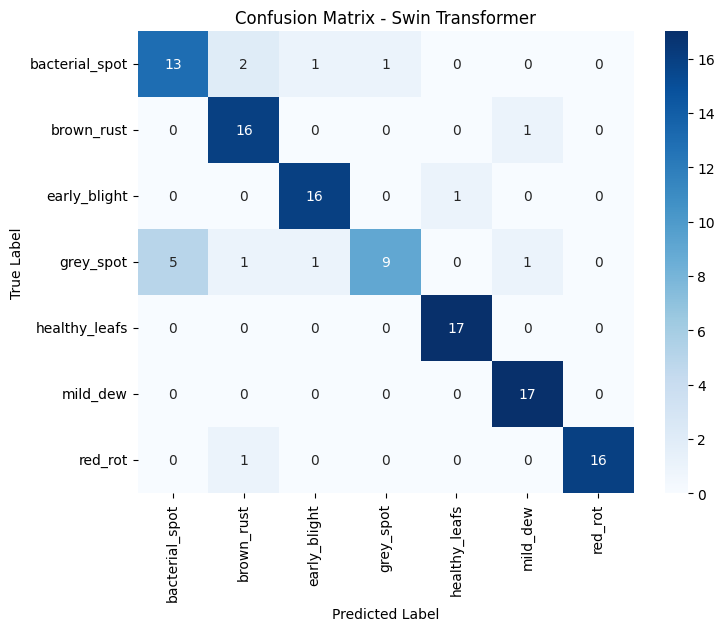

In [27]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true, y_pred)

class_names = train_ds.classes

plt.figure(figsize=(8, 6))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Swin Transformer")
plt.show()


In [29]:
per_class_acc = cm.diagonal() / cm.sum(axis=1)

for i, acc in enumerate(per_class_acc):
    print(f"{class_names[i]}: {acc*100:.2f}%")


bacterial_spot: 76.47%
brown_rust: 94.12%
early_blight: 94.12%
grey_spot: 52.94%
healthy_leafs: 100.00%
mild_dew: 100.00%
red_rot: 94.12%


STEP 5 — Final Integrated Leaf Disease System

In [30]:
import torch
import timm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

NUM_CLASSES = 7

swin_model = timm.create_model(
    "swin_tiny_patch4_window7_224",
    pretrained=False,
    num_classes=NUM_CLASSES
)

swin_model.load_state_dict(
    torch.load("/content/drive/MyDrive/swin_baseline_best.pth",
               map_location=device)
)
swin_model = swin_model.to(device)
swin_model.eval()


SwinTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
    (norm): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
  )
  (layers): Sequential(
    (0): SwinTransformerStage(
      (downsample): Identity()
      (blocks): Sequential(
        (0): SwinTransformerBlock(
          (norm1): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
          (attn): WindowAttention(
            (qkv): Linear(in_features=96, out_features=288, bias=True)
            (attn_drop): Dropout(p=0.0, inplace=False)
            (proj): Linear(in_features=96, out_features=96, bias=True)
            (proj_drop): Dropout(p=0.0, inplace=False)
            (softmax): Softmax(dim=-1)
          )
          (drop_path1): Identity()
          (norm2): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
          (mlp): Mlp(
            (fc1): Linear(in_features=96, out_features=384, bias=True)
            (act): GELU(approximate='none')
            (drop1): 

In [31]:
from torchvision.models.detection import fasterrcnn_resnet50_fpn

det_model = fasterrcnn_resnet50_fpn(
    pretrained=False,
    num_classes=2   # background + disease
)

det_model.load_state_dict(
    torch.load("/content/drive/MyDrive/faster_rcnn_leaf.pth",
               map_location=device)
)

det_model = det_model.to(device)
det_model.eval()


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 194MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu

In [32]:
from torchvision import transforms
from PIL import Image

cls_tfms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

class_names = train_ds.classes  # same order as training

def classify_leaf(image_path):
    img = Image.open(image_path).convert("RGB")
    img = cls_tfms(img).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = swin_model(img)
        probs = torch.softmax(outputs, dim=1)
        conf, pred = torch.max(probs, 1)

    return class_names[pred.item()], conf.item()


In [33]:
import torchvision.transforms as T

det_tfms = T.Compose([T.ToTensor()])

def detect_regions(image_path, score_thresh=0.5):
    img = Image.open(image_path).convert("RGB")
    img_tensor = det_tfms(img).to(device)

    with torch.no_grad():
        prediction = det_model([img_tensor])[0]

    boxes = prediction["boxes"]
    scores = prediction["scores"]

    keep = scores >= score_thresh
    boxes = boxes[keep]

    return boxes, img.size


In [34]:
def compute_severity(boxes, img_size):
    img_w, img_h = img_size
    img_area = img_w * img_h

    infected_area = 0.0
    for box in boxes:
        x1, y1, x2, y2 = box
        infected_area += ((x2 - x1) * (y2 - y1)).item()

    severity = infected_area / img_area if img_area > 0 else 0.0
    return float(severity)


In [35]:
def estimate_lifespan(num_boxes, severity):
    base_life = 100  # days (healthy leaf)

    lifespan = base_life \
               - (num_boxes * 10) \
               - (severity * 50)

    return max(int(lifespan), 10)


In [36]:
def full_leaf_analysis(image_path):
    # 1️⃣ Disease classification
    disease, confidence = classify_leaf(image_path)

    # 2️⃣ Localization
    boxes, img_size = detect_regions(image_path)
    num_boxes = len(boxes)

    # 3️⃣ Severity
    severity = compute_severity(boxes, img_size)

    # 4️⃣ Lifespan
    lifespan = estimate_lifespan(num_boxes, severity)

    return {
        "Disease": disease,
        "Confidence (%)": round(confidence * 100, 2),
        "Infected Regions": num_boxes,
        "Severity Score": round(severity, 3),
        "Estimated Leaf Lifespan (days)": lifespan
    }


In [37]:
image_path = "/content/drive/MyDrive/leaf2.jpg"

result = full_leaf_analysis(image_path)

for k, v in result.items():
    print(f"{k}: {v}")


Disease: bacterial_spot
Confidence (%): 99.7
Infected Regions: 27
Severity Score: 0.272
Estimated Leaf Lifespan (days): 10


Draw Bounding Boxes on Leaf Image (Faster R‑CNN Output)

In [38]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import torchvision.transforms as T
import torch

det_tfms = T.Compose([T.ToTensor()])

def show_bounding_boxes(image_path, score_thresh=0.5):
    # Load image
    img = Image.open(image_path).convert("RGB")
    img_tensor = det_tfms(img).to(device)

    # Faster R-CNN inference
    with torch.no_grad():
        prediction = det_model([img_tensor])[0]

    boxes = prediction["boxes"]
    scores = prediction["scores"]

    # Filter by confidence
    keep = scores >= score_thresh
    boxes = boxes[keep]
    scores = scores[keep]

    # Plot
    fig, ax = plt.subplots(1, figsize=(8, 8))
    ax.imshow(img)

    for box, score in zip(boxes, scores):
        x1, y1, x2, y2 = box.cpu().numpy()
        width = x2 - x1
        height = y2 - y1

        rect = patches.Rectangle(
            (x1, y1),
            width,
            height,
            linewidth=2,
            edgecolor='red',
            facecolor='none'
        )
        ax.add_patch(rect)
        ax.text(
            x1, y1 - 5,
            f"{score:.2f}",
            color='red',
            fontsize=10,
            backgroundcolor="white"
        )

    ax.set_title("Detected Diseased Regions")
    ax.axis("off")
    plt.show()


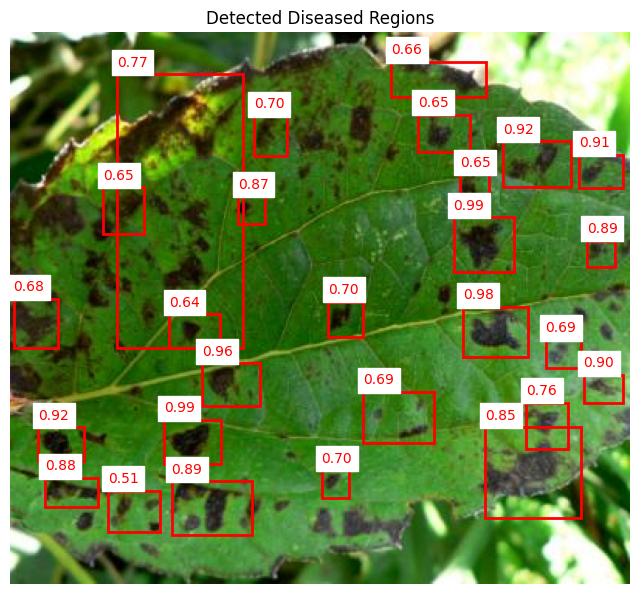

In [39]:
image_path = "/content/drive/MyDrive/leaf2.jpg"
show_bounding_boxes(image_path)


In [40]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import torchvision.transforms as T
import torch

det_tfms = T.Compose([T.ToTensor()])

def show_boxes_with_disease(image_path, score_thresh=0.5):
    # ---------- Swin Prediction ----------
    disease, confidence = classify_leaf(image_path)

    # ---------- Faster R-CNN Prediction ----------
    img = Image.open(image_path).convert("RGB")
    img_tensor = det_tfms(img).to(device)

    with torch.no_grad():
        prediction = det_model([img_tensor])[0]

    boxes = prediction["boxes"]
    scores = prediction["scores"]

    keep = scores >= score_thresh
    boxes = boxes[keep]
    scores = scores[keep]

    # ---------- Plot ----------
    fig, ax = plt.subplots(1, figsize=(8, 8))
    ax.imshow(img)

    # Draw bounding boxes
    for box, score in zip(boxes, scores):
        x1, y1, x2, y2 = box.cpu().numpy()
        rect = patches.Rectangle(
            (x1, y1),
            x2 - x1,
            y2 - y1,
            linewidth=2,
            edgecolor="red",
            facecolor="none"
        )
        ax.add_patch(rect)
        ax.text(
            x1, y1 - 5,
            f"{score:.2f}",
            color="red",
            fontsize=9,
            backgroundcolor="white"
        )

    # Disease name on top
    ax.text(
        10, 30,
        f"Disease: {disease} ({confidence*100:.2f}%)",
        fontsize=14,
        color="white",
        bbox=dict(facecolor="black", alpha=0.7)
    )

    ax.set_title("Leaf Disease Detection & Localization")
    ax.axis("off")
    plt.show()


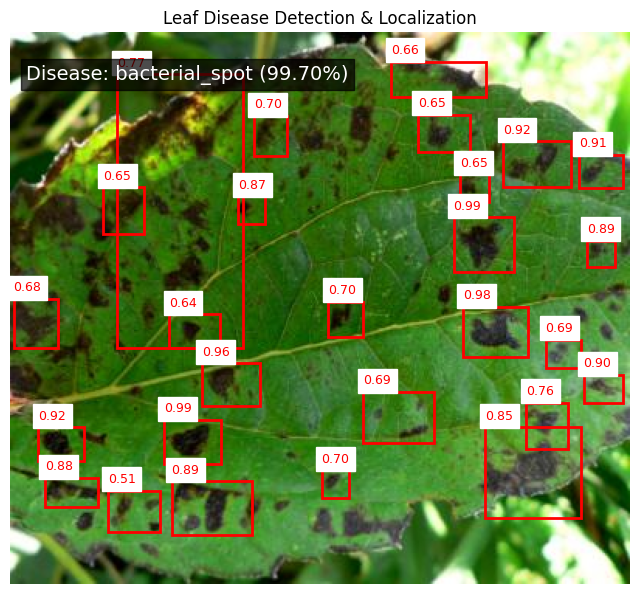

In [41]:
image_path = "/content/drive/MyDrive/leaf2.jpg"
show_boxes_with_disease(image_path)


In [42]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import torchvision.transforms as T
import torch

det_tfms = T.Compose([T.ToTensor()])

def show_boxes_disease_lifespan(image_path, score_thresh=0.5):
    # ---------- Swin Prediction ----------
    disease, confidence = classify_leaf(image_path)

    # ---------- Faster R-CNN Prediction ----------
    img = Image.open(image_path).convert("RGB")
    img_tensor = det_tfms(img).to(device)

    with torch.no_grad():
        prediction = det_model([img_tensor])[0]

    boxes = prediction["boxes"]
    scores = prediction["scores"]

    keep = scores >= score_thresh
    boxes = boxes[keep]
    scores = scores[keep]

    num_boxes = len(boxes)

    # ---------- Severity ----------
    img_w, img_h = img.size
    img_area = img_w * img_h

    infected_area = 0.0
    for box in boxes:
        x1, y1, x2, y2 = box
        infected_area += ((x2 - x1) * (y2 - y1)).item()

    severity = infected_area / img_area if img_area > 0 else 0.0

    # ---------- Lifespan ----------
    base_life = 100
    lifespan = base_life - (num_boxes * 10) - (severity * 50)
    lifespan = max(int(lifespan), 10)

    # ---------- Plot ----------
    fig, ax = plt.subplots(1, figsize=(8, 8))
    ax.imshow(img)

    # 🔴 Draw THICK bounding boxes
    for box, score in zip(boxes, scores):
        x1, y1, x2, y2 = box.cpu().numpy()
        rect = patches.Rectangle(
            (x1, y1),
            x2 - x1,
            y2 - y1,
            linewidth=4,          # 🔥 THICKER BOX
            edgecolor="red",
            facecolor="none"
        )
        ax.add_patch(rect)
        ax.text(
            x1, y1 - 8,
            f"{score:.2f}",
            color="red",
            fontsize=11,
            fontweight="bold",
            backgroundcolor="white"
        )

    # ---------- Text Overlay ----------
    ax.text(
        10, 30,
        f"Disease: {disease} ({confidence*100:.2f}%)",
        fontsize=14,
        color="white",
        bbox=dict(facecolor="black", alpha=0.75)
    )

    ax.text(
        10, 65,
        f"Infected Regions: {num_boxes}",
        fontsize=12,
        color="white",
        bbox=dict(facecolor="black", alpha=0.75)
    )

    ax.text(
        10, 100,
        f"Estimated Leaf Lifespan: {lifespan} days",
        fontsize=12,
        color="white",
        bbox=dict(facecolor="black", alpha=0.75)
    )

    ax.set_title("Leaf Disease Detection")
    ax.axis("off")
    plt.show()


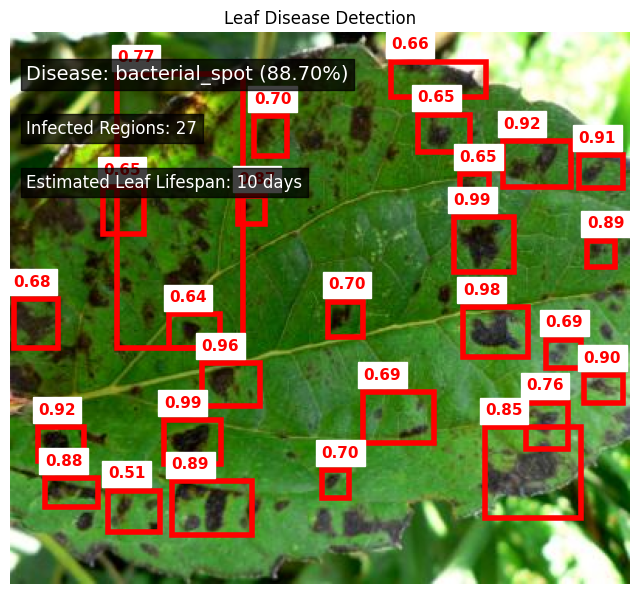

In [ ]:
image_path = "/content/drive/MyDrive/leaf2.jpg"
show_boxes_disease_lifespan(image_path)


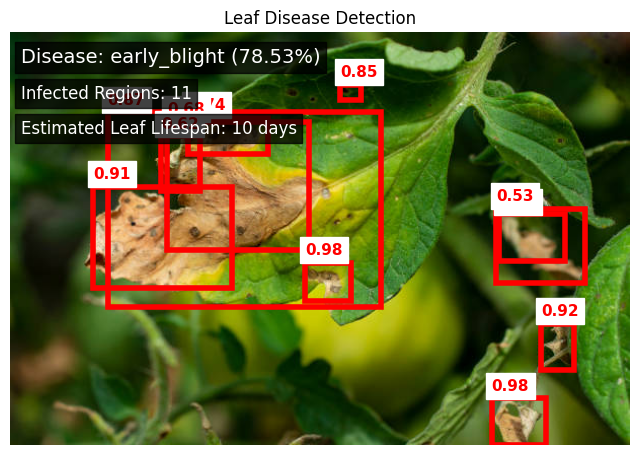

In [ ]:
image_path = "/content/drive/MyDrive/leaf6.jpg"
show_boxes_disease_lifespan(image_path)


In [ ]:
SWIN_MODEL_PATH = "/content/drive/MyDrive/swin_final_model.pth"
torch.save(swin_model.state_dict(), SWIN_MODEL_PATH)


Load Models

In [43]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [44]:
import timm
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

NUM_CLASSES = 7

swin_model = timm.create_model(
    "swin_tiny_patch4_window7_224",
    pretrained=False,
    num_classes=NUM_CLASSES
)

swin_model.load_state_dict(
    torch.load("/content/drive/MyDrive/swin_final_model.pth",
               map_location=device)
)

swin_model = swin_model.to(device)
swin_model.eval()


SwinTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 96, kernel_size=(4, 4), stride=(4, 4))
    (norm): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
  )
  (layers): Sequential(
    (0): SwinTransformerStage(
      (downsample): Identity()
      (blocks): Sequential(
        (0): SwinTransformerBlock(
          (norm1): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
          (attn): WindowAttention(
            (qkv): Linear(in_features=96, out_features=288, bias=True)
            (attn_drop): Dropout(p=0.0, inplace=False)
            (proj): Linear(in_features=96, out_features=96, bias=True)
            (proj_drop): Dropout(p=0.0, inplace=False)
            (softmax): Softmax(dim=-1)
          )
          (drop_path1): Identity()
          (norm2): LayerNorm((96,), eps=1e-05, elementwise_affine=True)
          (mlp): Mlp(
            (fc1): Linear(in_features=96, out_features=384, bias=True)
            (act): GELU(approximate='none')
            (drop1): 

In [45]:
FRCNN_MODEL_PATH = "/content/drive/MyDrive/faster_rcnn_leaf_final.pth"
torch.save(det_model.state_dict(), FRCNN_MODEL_PATH)


In [46]:
from torchvision.models.detection import fasterrcnn_resnet50_fpn

det_model = fasterrcnn_resnet50_fpn(
    pretrained=False,
    num_classes=2  # background + disease
)

det_model.load_state_dict(
    torch.load("/content/drive/MyDrive/faster_rcnn_leaf_final.pth",
               map_location=device)
)

det_model = det_model.to(device)
det_model.eval()


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu

In [47]:
import json

class_names = train_ds.classes

with open("/content/drive/MyDrive/class_names.json", "w") as f:
    json.dump(class_names, f)


In [48]:
import json

with open("/content/drive/MyDrive/class_names.json", "r") as f:
    class_names = json.load(f)


 METRICS

In [49]:
train_acc_list = []
val_acc_list = []
train_loss_list = []
val_loss_list = []


In [50]:
EPOCHS = 50

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(
        model, train_loader, optimizer, criterion
    )
    val_loss, val_acc = validate(
        model, val_loader, criterion
    )

    train_loss_list.append(train_loss)
    val_loss_list.append(val_loss)
    train_acc_list.append(train_acc)
    val_acc_list.append(val_acc)

    print(f"Epoch {epoch+1}/{EPOCHS} | "
          f"Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f}")


Epoch 1/50 | Train Acc: 0.9770 | Val Acc: 0.8899
Epoch 2/50 | Train Acc: 0.9828 | Val Acc: 0.8899
Epoch 3/50 | Train Acc: 0.9751 | Val Acc: 0.8899
Epoch 4/50 | Train Acc: 0.9751 | Val Acc: 0.8899
Epoch 5/50 | Train Acc: 0.9713 | Val Acc: 0.8899
Epoch 6/50 | Train Acc: 0.9732 | Val Acc: 0.8899
Epoch 7/50 | Train Acc: 0.9828 | Val Acc: 0.8899
Epoch 8/50 | Train Acc: 0.9770 | Val Acc: 0.8899
Epoch 9/50 | Train Acc: 0.9770 | Val Acc: 0.8899
Epoch 10/50 | Train Acc: 0.9808 | Val Acc: 0.8899
Epoch 11/50 | Train Acc: 0.9828 | Val Acc: 0.8899
Epoch 12/50 | Train Acc: 0.9828 | Val Acc: 0.8899
Epoch 13/50 | Train Acc: 0.9808 | Val Acc: 0.8899
Epoch 14/50 | Train Acc: 0.9847 | Val Acc: 0.8899
Epoch 15/50 | Train Acc: 0.9789 | Val Acc: 0.8899
Epoch 16/50 | Train Acc: 0.9770 | Val Acc: 0.8899
Epoch 17/50 | Train Acc: 0.9847 | Val Acc: 0.8899
Epoch 18/50 | Train Acc: 0.9828 | Val Acc: 0.8899
Epoch 19/50 | Train Acc: 0.9828 | Val Acc: 0.8899
Epoch 20/50 | Train Acc: 0.9713 | Val Acc: 0.8899
Epoch 21/

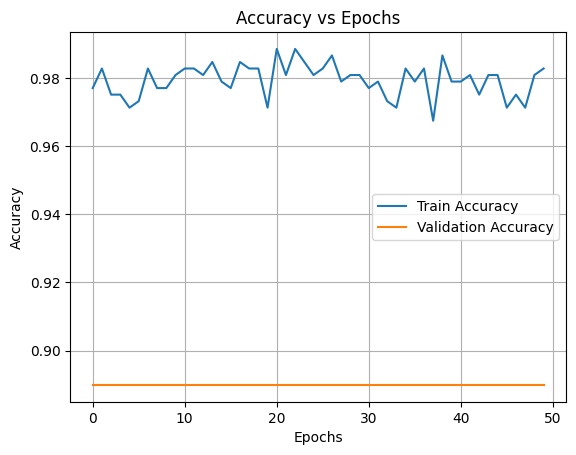

In [51]:
import matplotlib.pyplot as plt

plt.figure()
plt.plot(train_acc_list, label="Train Accuracy")
plt.plot(val_acc_list, label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy vs Epochs")
plt.legend()
plt.grid()
plt.show()


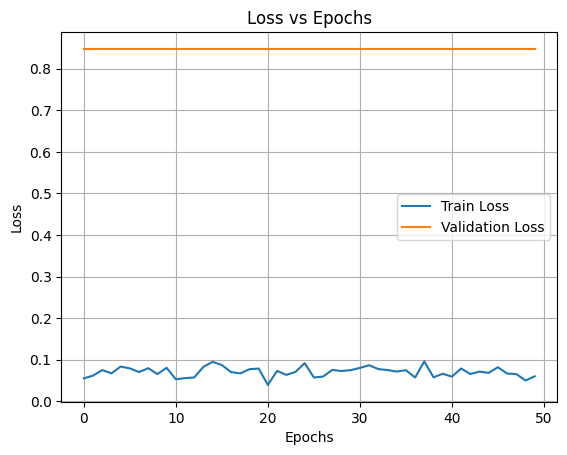

In [52]:
plt.figure()
plt.plot(train_loss_list, label="Train Loss")
plt.plot(val_loss_list, label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss vs Epochs")
plt.legend()
plt.grid()
plt.show()


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

y_true = []
y_pred = []

model.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        _, preds = torch.max(outputs, 1)

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())


In [ ]:
precision = precision_score(y_true, y_pred, average=None)
recall = recall_score(y_true, y_pred, average=None)
f1 = f1_score(y_true, y_pred, average=None)


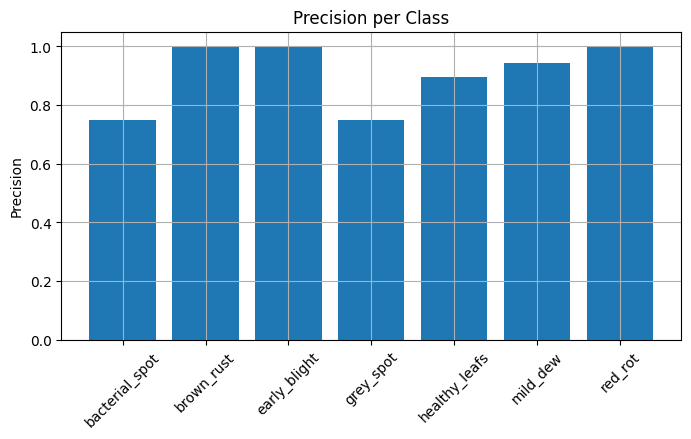

In [ ]:
plt.figure(figsize=(8,4))
plt.bar(class_names, precision)
plt.xticks(rotation=45)
plt.ylabel("Precision")
plt.title("Precision per Class")
plt.grid()
plt.show()


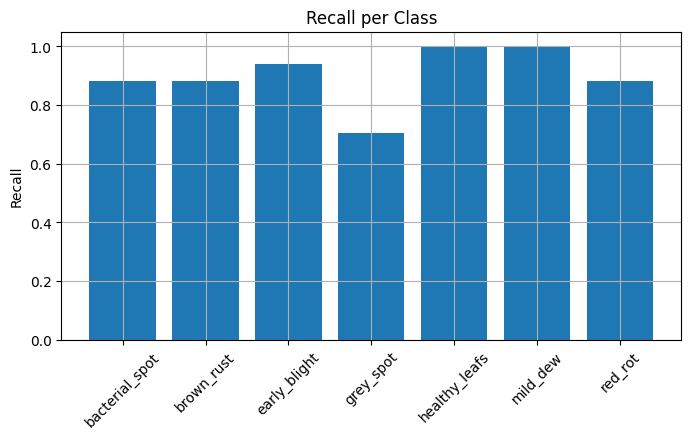

In [ ]:
plt.figure(figsize=(8,4))
plt.bar(class_names, recall)
plt.xticks(rotation=45)
plt.ylabel("Recall")
plt.title("Recall per Class")
plt.grid()
plt.show()


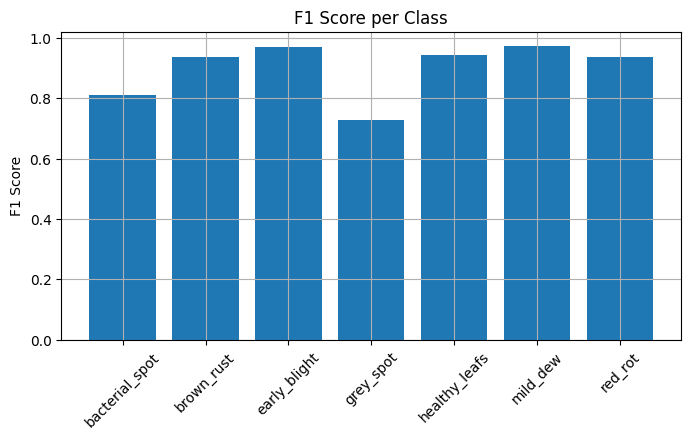

In [ ]:
plt.figure(figsize=(8,4))
plt.bar(class_names, f1)
plt.xticks(rotation=45)
plt.ylabel("F1 Score")
plt.title("F1 Score per Class")
plt.grid()
plt.show()


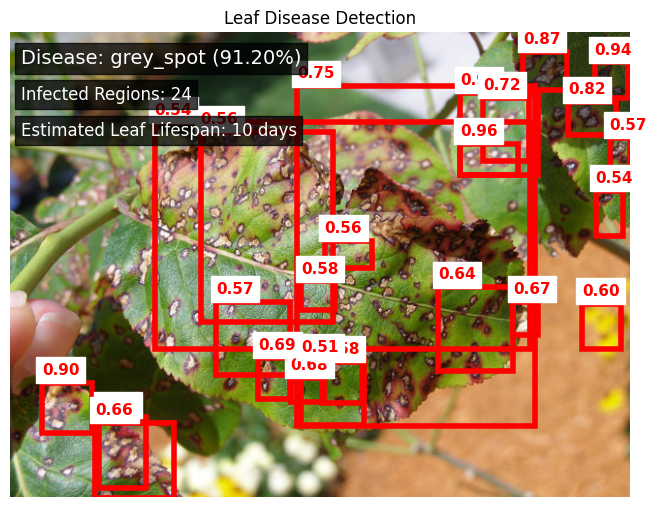

In [ ]:
image_path = "/content/drive/MyDrive/leaf9.jpg"
show_boxes_disease_lifespan(image_path)


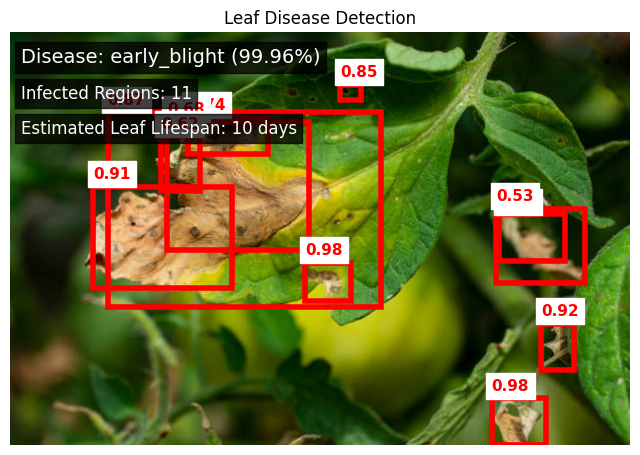

In [ ]:
image_path = "/content/drive/MyDrive/leaf6.jpg"
show_boxes_disease_lifespan(image_path)


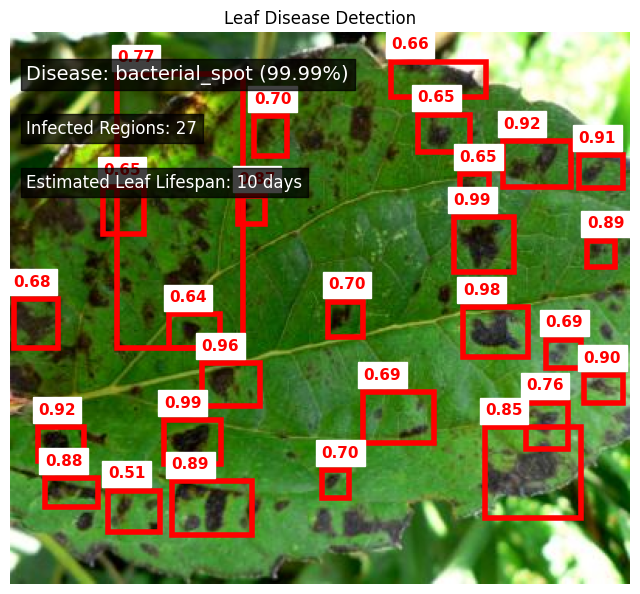

In [ ]:
image_path = "/content/drive/MyDrive/leaf2.jpg"
show_boxes_disease_lifespan(image_path)


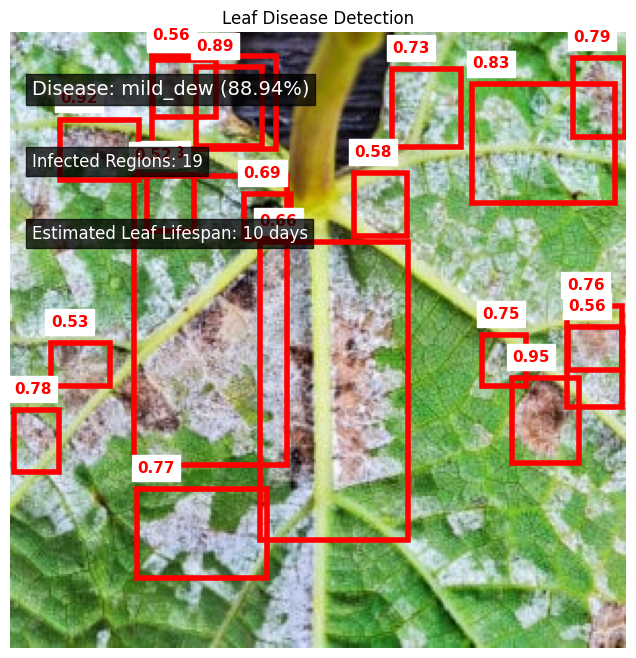

In [ ]:
image_path = "/content/drive/MyDrive/img4.jpg"
show_boxes_disease_lifespan(image_path)


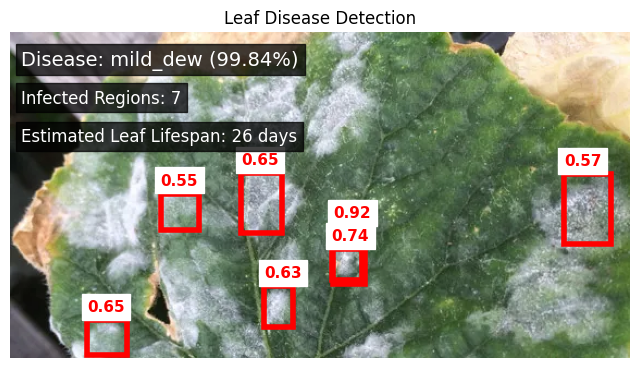

In [ ]:
image_path = "/content/drive/MyDrive/img6.jpg"
show_boxes_disease_lifespan(image_path)


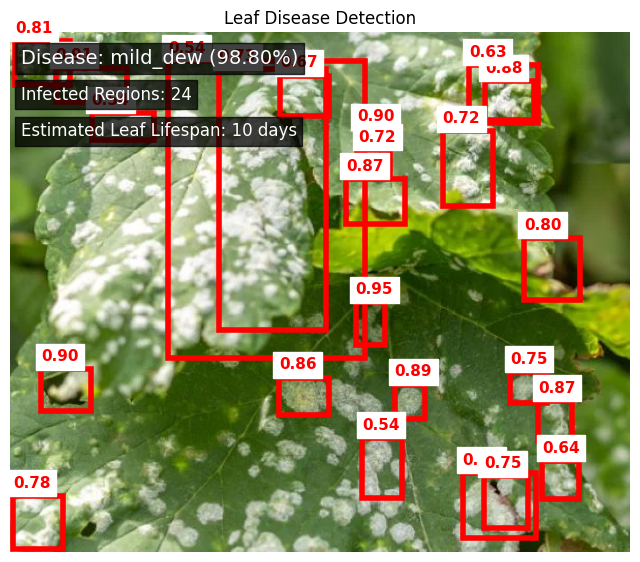

In [ ]:
image_path = "/content/drive/MyDrive/img7.jpg"
show_boxes_disease_lifespan(image_path)


Load Model and predict

In [54]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [55]:
import torch
import timm
import torchvision.transforms as T
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from torchvision.models.detection import fasterrcnn_resnet50_fpn


In [56]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)


cuda


In [57]:
class_names = [
    "bacterial_spot",
    "brown_rust",
    "early_blight",
    "grey_spot",
    "healthy",
    "mild_dew",
    "red_rot"
]

NUM_CLASSES = len(class_names)


In [58]:
swin_model = timm.create_model(
    "swin_tiny_patch4_window7_224",
    pretrained=False,
    num_classes=NUM_CLASSES
)

swin_model.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/swin_final_model.pth",
        map_location=device
    )
)

swin_model = swin_model.to(device)
swin_model.eval()

print("✅ Swin model loaded")


✅ Swin model loaded


In [59]:
det_model = fasterrcnn_resnet50_fpn(
    pretrained=False,
    num_classes=2   # background + disease
)

det_model.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/faster_rcnn_leaf_final.pth",
        map_location=device
    )
)

det_model = det_model.to(device)
det_model.eval()

print("✅ Faster R-CNN model loaded")


✅ Faster R-CNN model loaded


In [60]:
# For Swin (classification)
cls_tfms = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# For Faster R-CNN (detection)
det_tfms = T.Compose([T.ToTensor()])


In [61]:
def classify_leaf(image_path):
    img = Image.open(image_path).convert("RGB")
    img = cls_tfms(img).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = swin_model(img)
        probs = torch.softmax(outputs, dim=1)
        conf, pred = torch.max(probs, 1)

    return class_names[pred.item()], conf.item()


In [62]:
def predict_leaf(image_path, score_thresh=0.5):
    # ---- Swin Prediction ----
    disease, confidence = classify_leaf(image_path)

    # ---- Faster R-CNN Prediction ----
    img = Image.open(image_path).convert("RGB")
    img_tensor = det_tfms(img).to(device)

    with torch.no_grad():
        pred = det_model([img_tensor])[0]

    boxes = pred["boxes"]
    scores = pred["scores"]

    keep = scores >= score_thresh
    boxes = boxes[keep]
    scores = scores[keep]

    num_boxes = len(boxes)

    # ---- Severity & Lifespan ----
    img_w, img_h = img.size
    img_area = img_w * img_h

    infected_area = 0.0
    for b in boxes:
        x1, y1, x2, y2 = b
        infected_area += ((x2 - x1) * (y2 - y1)).item()

    severity = infected_area / img_area if img_area > 0 else 0.0
    lifespan = max(int(100 - num_boxes*10 - severity*50), 10)

    # ---- Visualization ----
    fig, ax = plt.subplots(1, figsize=(8, 8))
    ax.imshow(img)

    for box in boxes:
        x1, y1, x2, y2 = box.cpu().numpy()
        rect = patches.Rectangle(
            (x1, y1),
            x2 - x1,
            y2 - y1,
            linewidth=4,
            edgecolor="red",
            facecolor="none"
        )
        ax.add_patch(rect)

    ax.text(
        10, 30,
        f"Disease: {disease} ({confidence*100:.2f}%)",
        fontsize=14,
        color="white",
        bbox=dict(facecolor="black", alpha=0.75)
    )
    ax.text(
        10, 65,
        f"Infected Regions: {num_boxes}",
        fontsize=12,
        color="white",
        bbox=dict(facecolor="black", alpha=0.75)
    )
    ax.text(
        10, 100,
        f"Estimated Lifespan: {lifespan} days",
        fontsize=12,
        color="white",
        bbox=dict(facecolor="black", alpha=0.75)
    )

    ax.axis("off")
    plt.show()


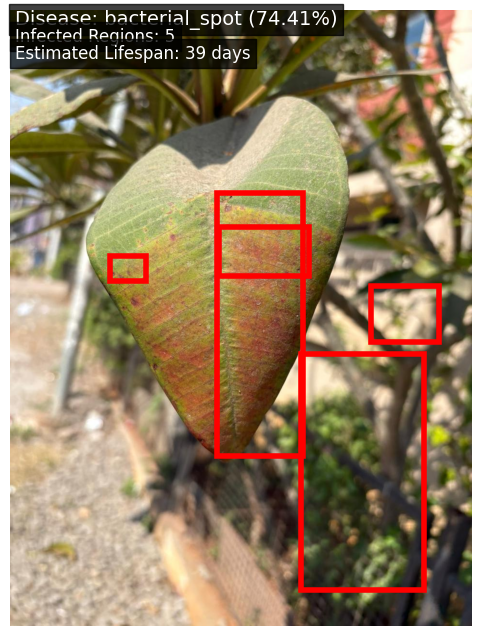

In [63]:
image_path = "/content/drive/MyDrive/img17.jpg"
predict_leaf(image_path)


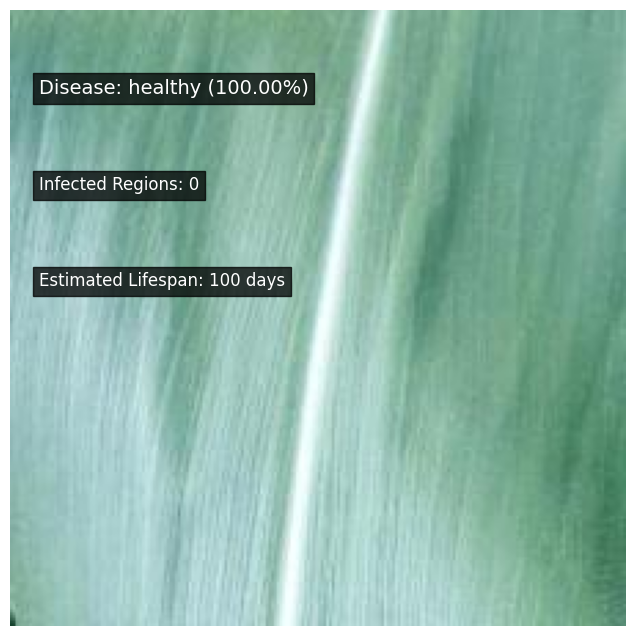

In [ ]:
image_path = "/content/drive/MyDrive/img18.jpg"
predict_leaf(image_path)


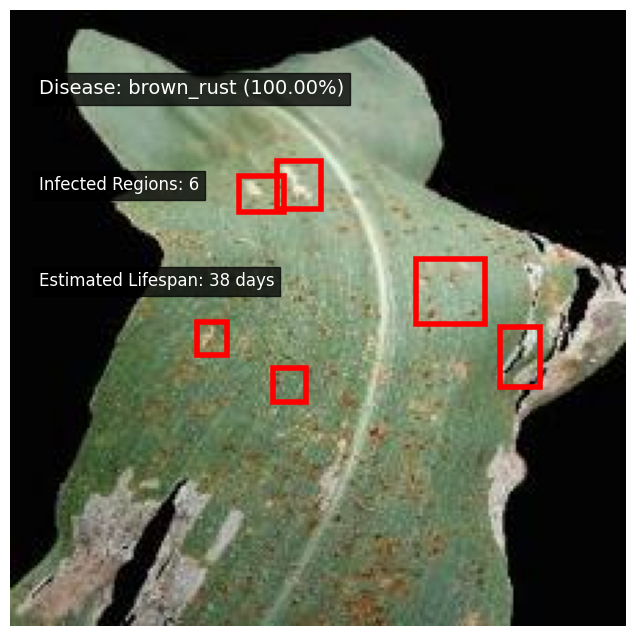

In [ ]:
image_path = "/content/drive/MyDrive/img23.jpg"
predict_leaf(image_path)


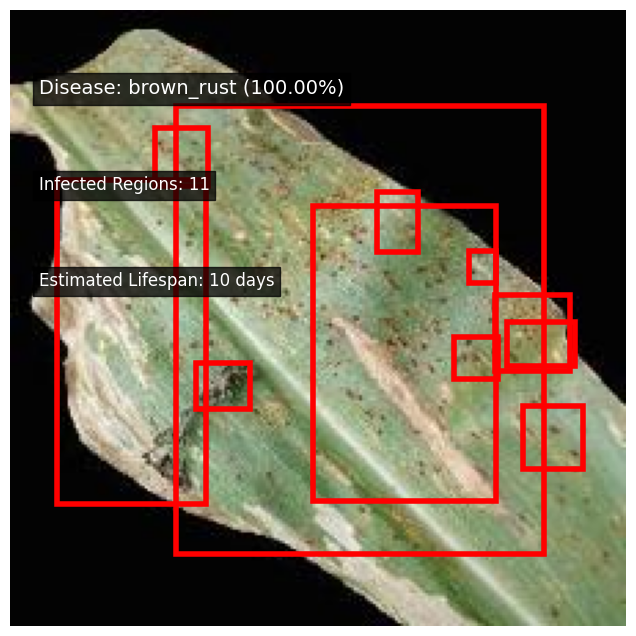

In [ ]:
image_path = "/content/drive/MyDrive/img25.jpg"
predict_leaf(image_path)


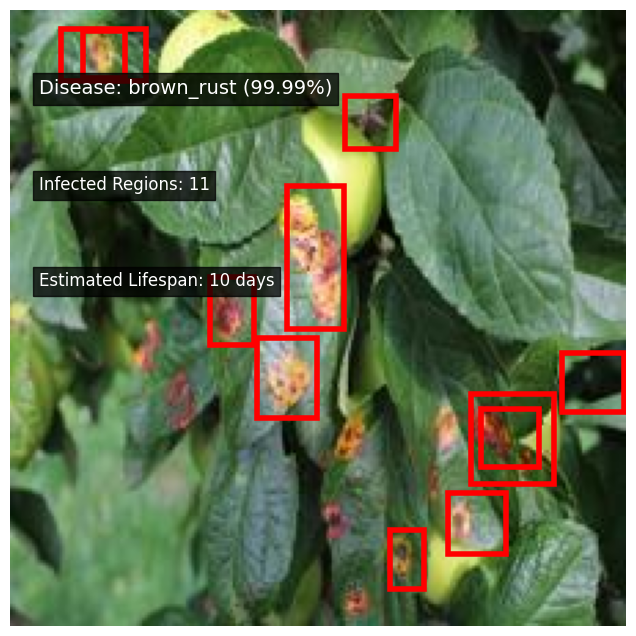

In [ ]:
image_path = "/content/drive/MyDrive/img28.jpg"
predict_leaf(image_path)


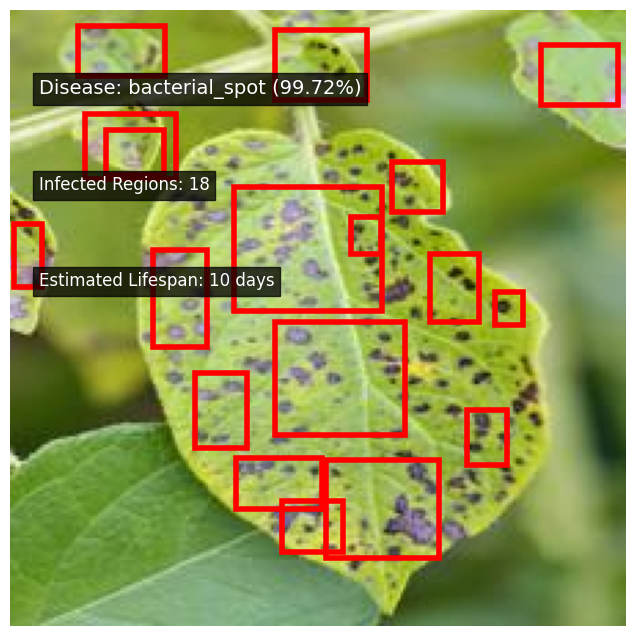

In [ ]:
image_path = "/content/drive/MyDrive/2 img.jpg"
predict_leaf(image_path)


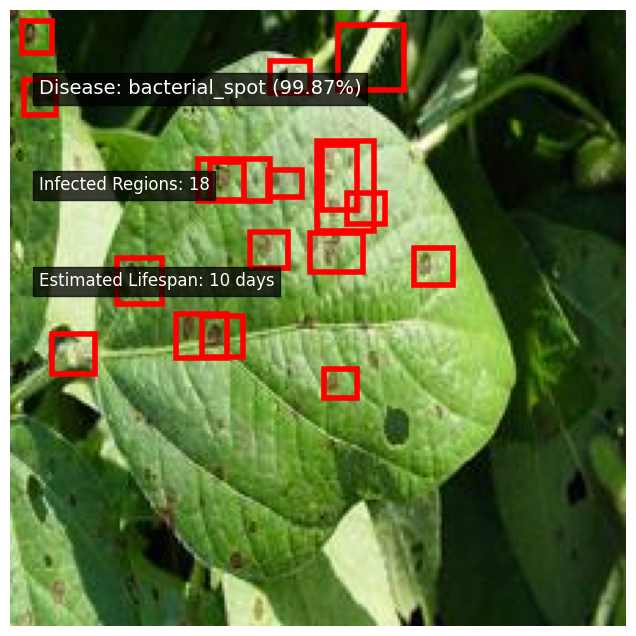

In [ ]:
image_path = "/content/drive/MyDrive/img31.jpg"
predict_leaf(image_path)


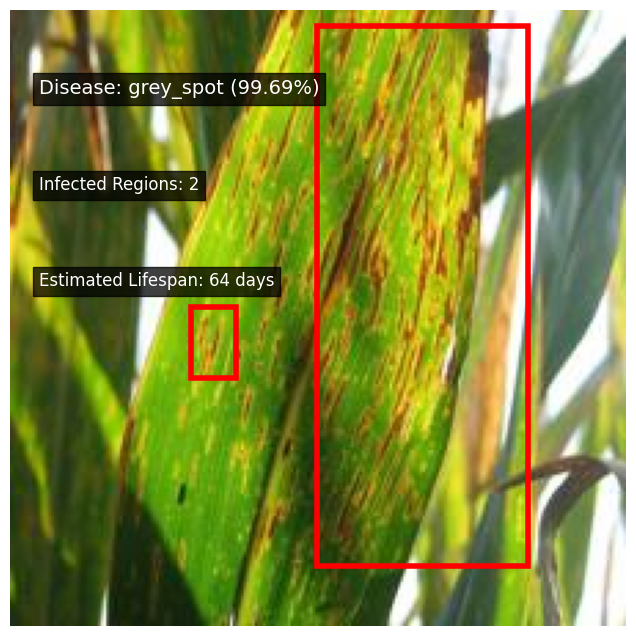

In [ ]:
image_path = "/content/drive/MyDrive/img32.jpg"
predict_leaf(image_path)

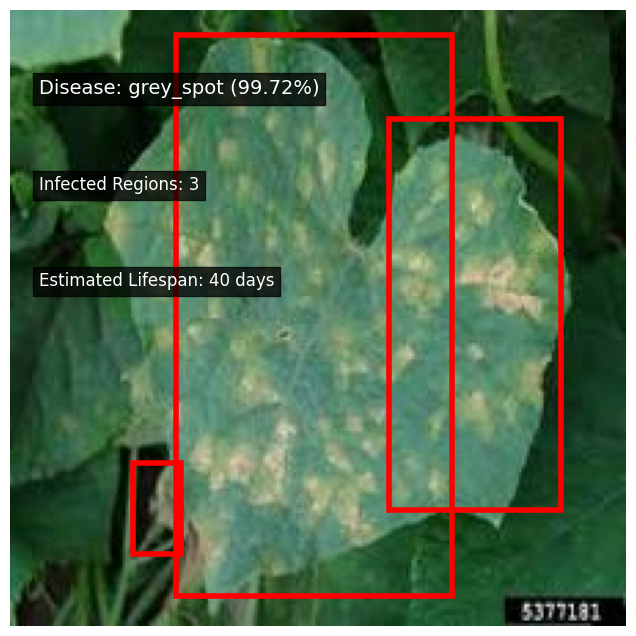

In [ ]:
image_path = "/content/drive/MyDrive/images (29).jpg"
predict_leaf(image_path)

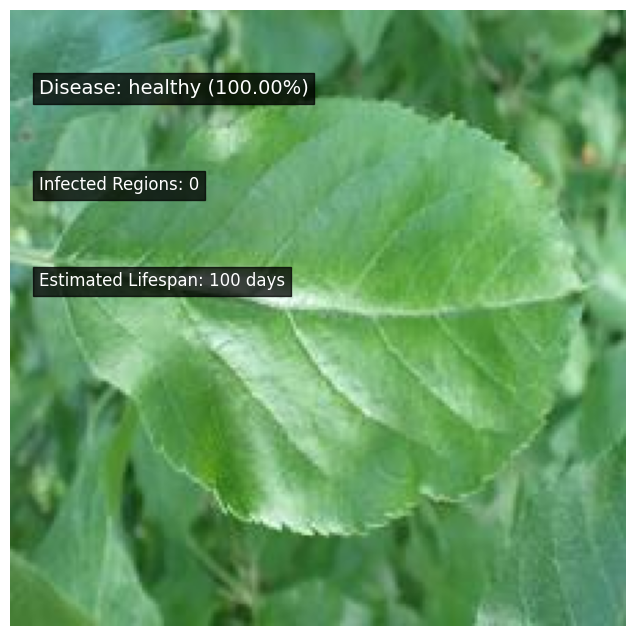

In [ ]:
image_path = "/content/drive/MyDrive/img36.jpg"
predict_leaf(image_path)

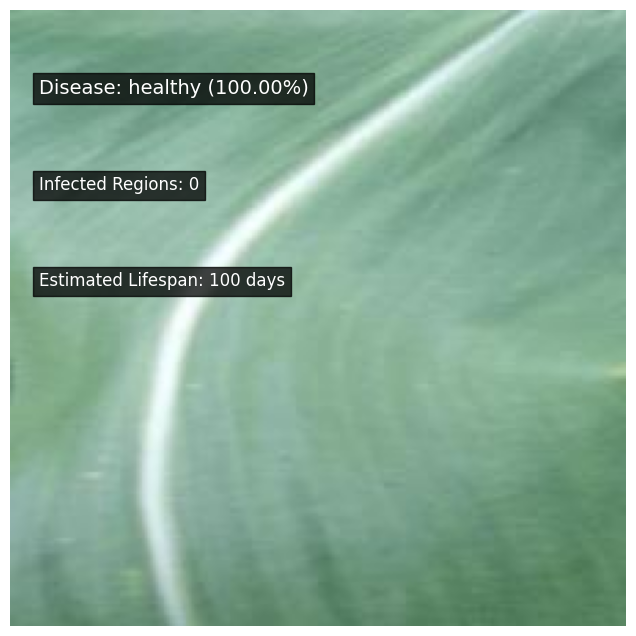

In [ ]:
image_path = "/content/drive/MyDrive/image (16).jpg"
predict_leaf(image_path)

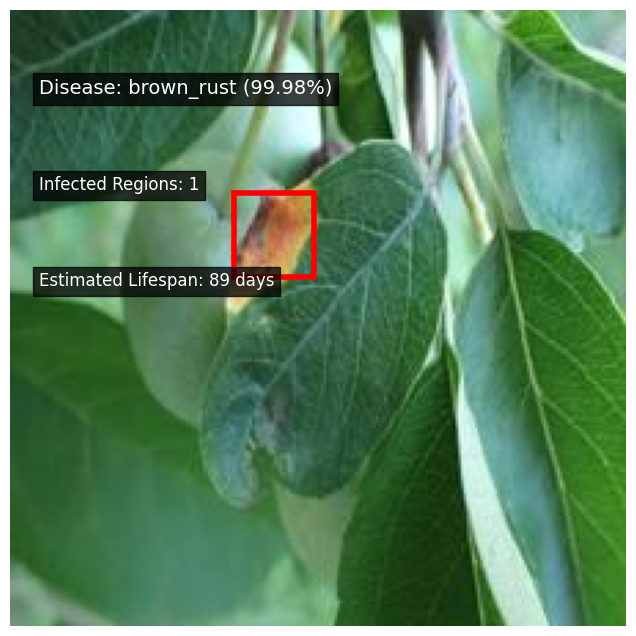

In [ ]:
image_path = "/content/drive/MyDrive/img38.jpg"
predict_leaf(image_path)

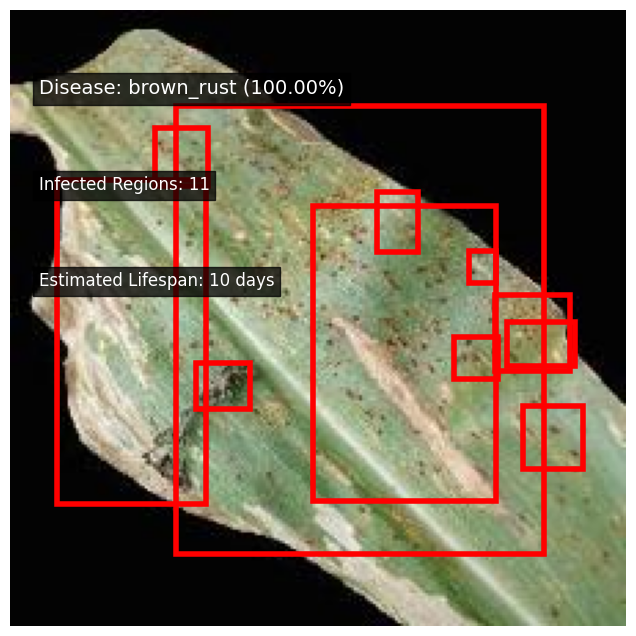

In [ ]:
image_path = "/content/drive/MyDrive/leaf0.jpg"
predict_leaf(image_path)

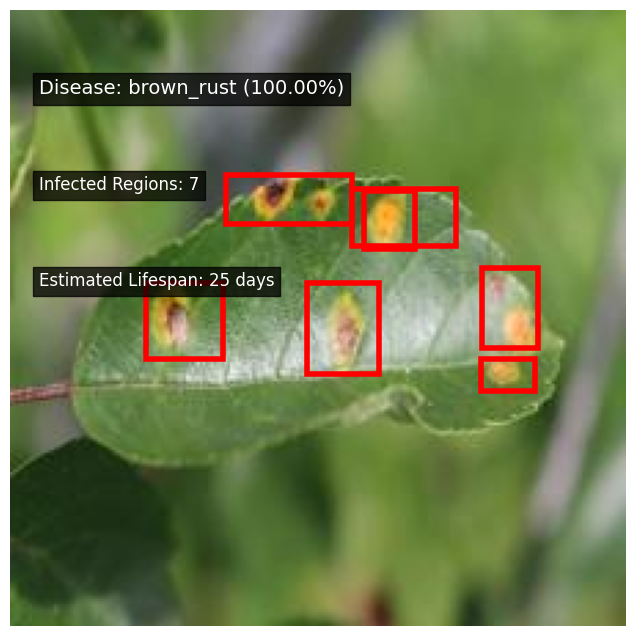

In [ ]:
image_path = "/content/drive/MyDrive/leaf.jpg"
predict_leaf(image_path)

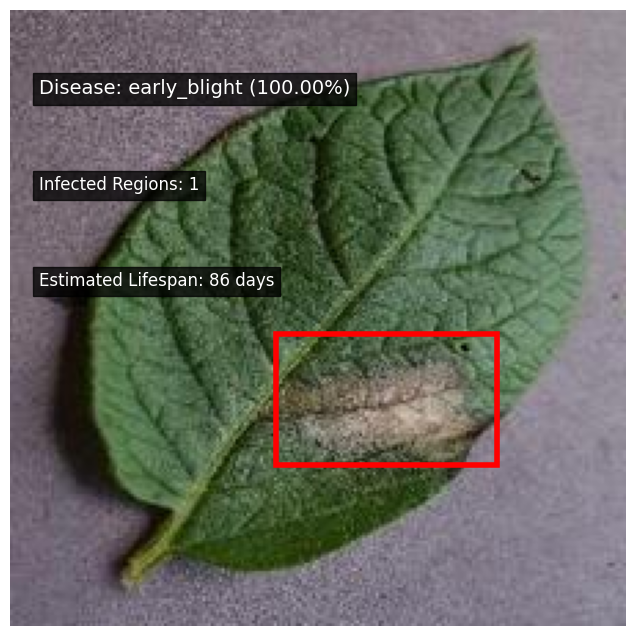

In [ ]:
image_path = "/content/drive/MyDrive/blight2.jpg"
predict_leaf(image_path)

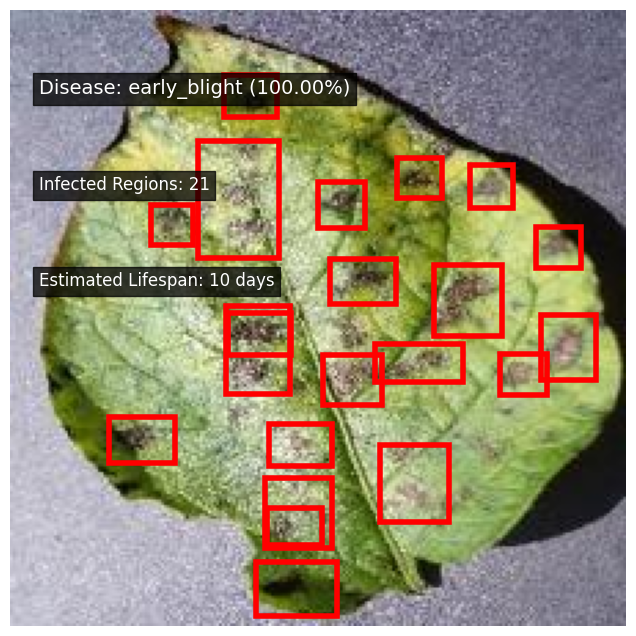

In [ ]:
image_path = "/content/drive/MyDrive/blight3.jpg"
predict_leaf(image_path)

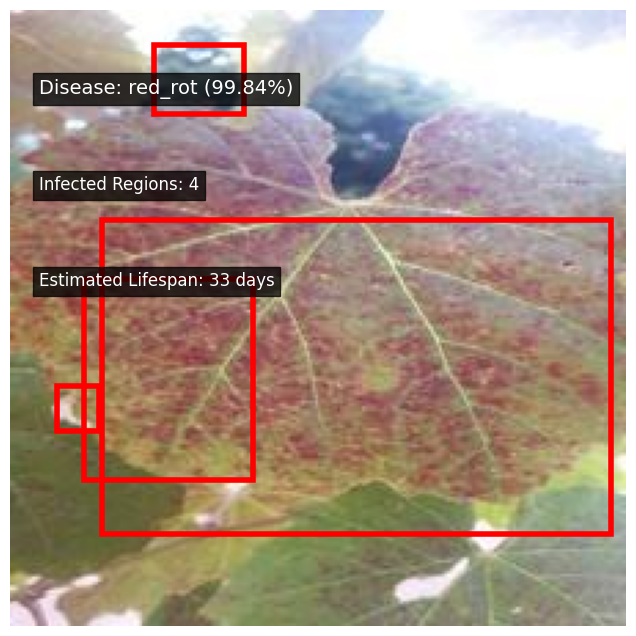

In [ ]:
image_path = "/content/drive/MyDrive/rot1.jpg"
predict_leaf(image_path)

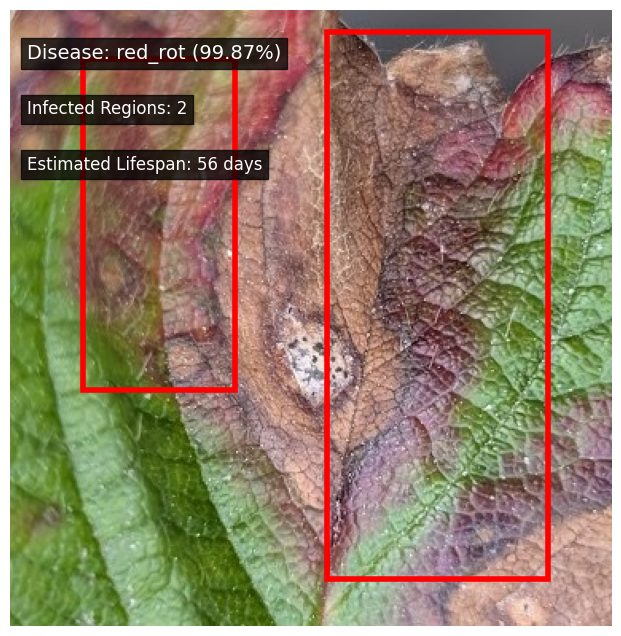

In [ ]:
image_path = "/content/drive/MyDrive/rot3.jpg"
predict_leaf(image_path)

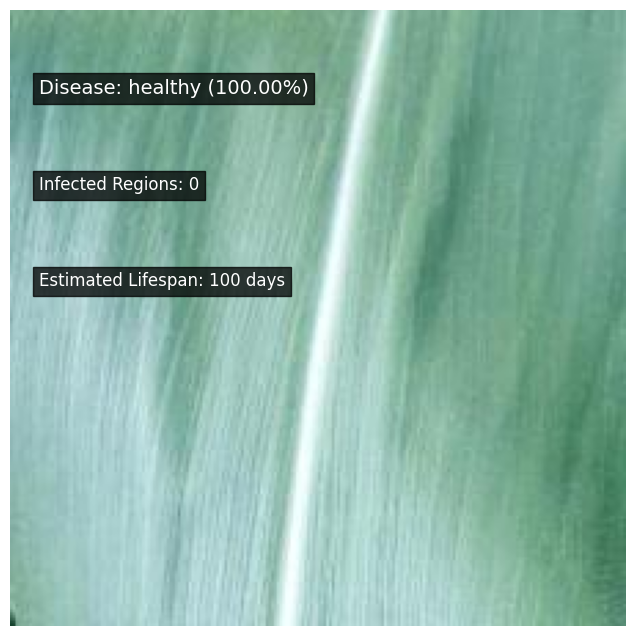

In [64]:
image_path = "/content/drive/MyDrive/img18.jpg"
predict_leaf(image_path)


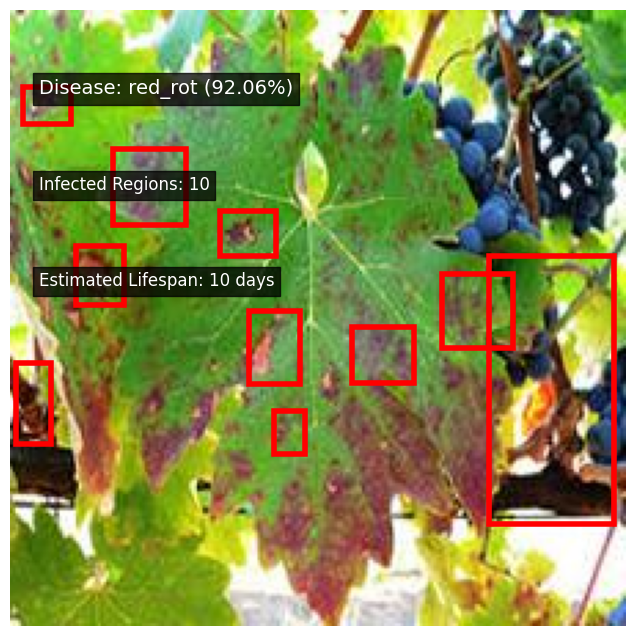

In [66]:
image_path = "/content/drive/MyDrive/leafs.jpg"
predict_leaf(image_path)


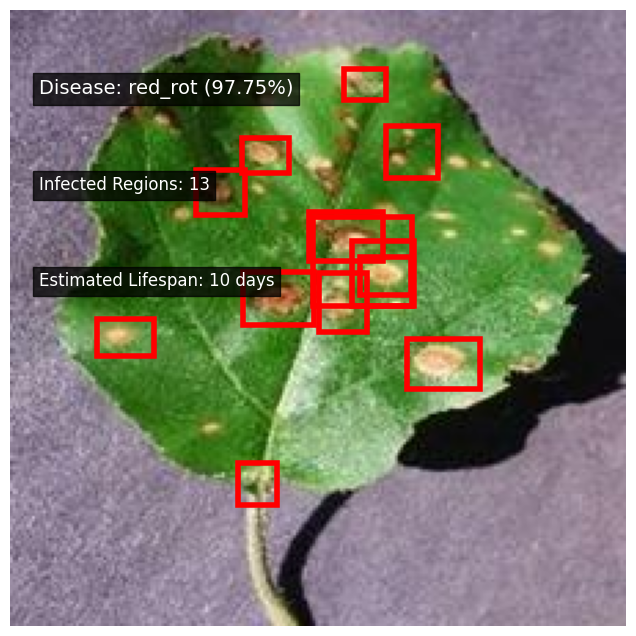

In [74]:
image_path = "/content/drive/MyDrive/red rot.jpg"
predict_leaf(image_path)